# Exploring the world of audio augmentations and trasformations

If you want to use librosa trasformations in the training, remeber to add them inside a function that randomizes them.

Useful links:

https://pytorch.org/audio/stable/tutorials/audio_feature_extractions_tutorial.html#sphx-glr-tutorials-audio-feature-extractions-tutorial-py

Summary:

* 1D:
     - use audiomentations as they are already well implemented to be random and all    
     - Librosa has nice effects, but if we want to use them we should create functions that take care of randomizing them

* 2D:
    - use torchaudio library. It requires a different preprocessing of the audio. See below for details (post scriptum: non mi pare sia così diverso questo preprocessing actually...)
    - There is something wrong with our MELs.


After this exploration it remains to do:

1. Understanding MEL, (STFT and MFCC). MEL doesn't work properly
2. Deciding which transformations to use. I suggest to run benchmarks first, without any trans, then try with different trans and see what happens.
3. Normalization! What to use? What to do? MinMax? StandardScaler? What? See notebook `usage.ipynb` in FMA repository, they use standardscaler. 

In [116]:
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio
from torchaudio.utils import download_asset
from mgr.utils_mgr import create_dataloaders
import torchaudio.transforms as T
import numpy as np
import torch
import torchaudio

In [2]:
net_type = "1D"
PATH_DATA = "../data/"
batch_size = 64
num_workers = 4
transforms = None

train_dataloader, val_dataloader, test_dataloader = create_dataloaders(PATH_DATA=PATH_DATA, transforms=transforms, net_type=net_type,batch_size=batch_size,num_workers=num_workers)


In [3]:
x = train_dataloader.dataset[1000][0]

## Listen to audio and play with trasformations

In [4]:
from IPython.display import Audio
import numpy as np

# Assuming `audio_array` is your audio array
# audio_array = ...

# Specify the sampling rate
sample_rate = 44100  # Adjust according to your audio data

# Convert the audio array to a numpy array (if it's not already)
audio_np = np.array(x)

# Display the audio
Audio(data=audio_np, rate=sample_rate)


In [5]:
Audio(librosa.effects.harmonic(x), rate=44100)

In [6]:
Audio(librosa.effects.percussive(x), rate=44100)

Stretched makes clip last shorter. Add silence to obviate this.

In [7]:
stretched = librosa.effects.time_stretch(x, rate=1.2)

In [8]:
stretched.shape

(1, 218453)

In [9]:
x.shape[1]

262144

In [10]:
# Zeros to append --> silence
zero_vector = np.zeros(shape=(1,x.shape[1] - stretched.shape[1]))
zero_vector.shape

(1, 43691)

In [11]:
stretched.shape

(1, 218453)

In [12]:
zero_vector.shape

(1, 43691)

In [13]:
np.concatenate((stretched, zero_vector),axis=1).shape

(1, 262144)

In [14]:
Audio(np.concatenate((stretched, zero_vector),axis=1), rate=44100)

In [15]:
Audio(librosa.effects.time_stretch(x, rate=1.2), rate=44100)

In [16]:
Audio(librosa.effects.pitch_shift(x, sr=44100, n_steps=-5), rate=44100)

In [17]:
Audio(librosa.effects.preemphasis(x, coef=.97), rate=44100)

### Adding noise

In [18]:
import numpy as np

# Set the mean and standard deviation of the Gaussian distribution
mean = 0
std = 1

# Generate a random sample from the Gaussian distribution with the same shape as x
sample = np.random.normal(mean, std, size=x.shape)

sample.shape


(1, 262144)

In [19]:
Audio(x + sample, rate=44100)

In [20]:
Audio(x+.1*sample, rate=44100)

## Using audiomentations

In [22]:
import audiomentations as audio

train_audio_transform = audio.Compose([   
    # add gaussian noise to the samples
    audio.AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=0.5),
    # change the speed or duration of the signal without changing the pitch
    audio.TimeStretch(min_rate=0.8, max_rate=1.25, p=0.5),
    # pitch shift the sound up or down without changing the tempo
    #audio.PitchShift(min_semitones=-4, max_semitones=4, p=0.5)
])

In [23]:
Audio(train_audio_transform(x, sample_rate=44100), rate=44100)

## 2D transforms

**WARNING**: why the fuck in github raggiungono quasi il 50% di accuracy usando una semplice SVC???????!!! Guarda notebook `usage.ipynb`


*Nota*: Here I'll be using torchaudio transformations. They require a different preprocessing of audio to get a spectrogram. I will begin showing how to obtain the correct pipeline to make torchaudio transformations work, and only eventually how to implement the new pipeline with our standard-librosa one.

In [26]:
# This is how we get the audio data in the dataset class
PATH_DATA = "../data/"


from mgr.utils_mgr import getAudio

audio, sr = getAudio(2, PATH_DATA = PATH_DATA)

#Select random clip from audio
start = np.random.randint(0, (audio.shape[0]-2**18))
audio = audio[start:start+2**18]
audio.shape


(262144,)

In [27]:
Audio(audio, rate=sr)

The first thing to do is to transform the waveform into a torch tensor object, and then add the channel information.
We could try to use dismiss the utils-way of importing audio, in favour of the torchaudio way of doing it.
For now I'm just trying to find a way to make transformations work with out data.

In [28]:
print("audio shape that we usually work with",audio.shape)
taudio = torch.Tensor(audio).unsqueeze(0)
print("if it were loaded with torchaudio",taudio.shape)

audio shape that we usually work with (262144,)
if it were loaded with torchaudio torch.Size([1, 262144])


### Stretching

In [29]:
# It is possible that our way of proceeding doesn't work because we're using a different n_fft value.
# What I'll try next is to make changes to the torchaudio spectrogram to see if we can get the same results as with librosa.

spectrogram = torchaudio.transforms.Spectrogram(power=None) 
stretch = torchaudio.transforms.TimeStretch()
original = spectrogram(taudio)
stretched_1_2 = stretch(original, 1.2)


print("original shape",original.shape)
print("stretched shape",stretched_1_2.shape)

original shape torch.Size([1, 201, 1311])
stretched shape torch.Size([1, 201, 1093])


In [30]:
def plot_waveform(waveform, sr, title="Waveform", ax=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform[0], linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")


You see that the clip lasts longer

/tmp/ipykernel_1408782/623082153.py:21: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")


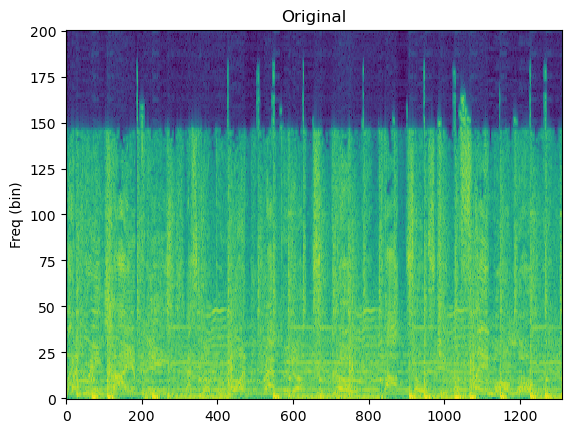

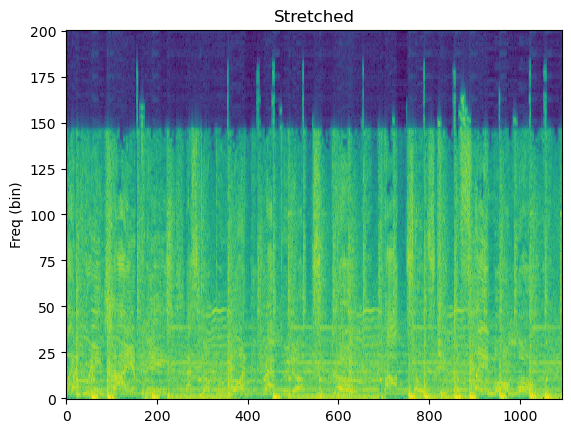

In [31]:
plot_spectrogram(original[0], title="Original", ylabel="Freq (bin)", ax=None)
plot_spectrogram(stretched_1_2[0], title="Stretched", ylabel="Freq (bin)", ax=None)

### Frequency Masking

In [32]:
masking = torchaudio.transforms.FrequencyMasking(freq_mask_param=100)
spec = torchaudio.transforms.Spectrogram() # If I set power to None, it will raise an error. To investigate.
original = spec(taudio)
masked = masking(original) 

It seems that event the original is kinda masked on the higher frequencies... 


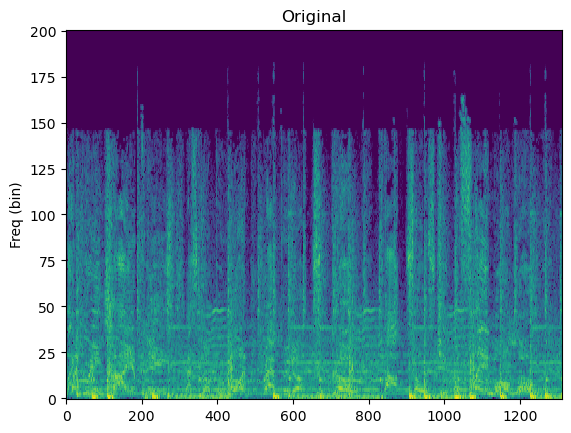

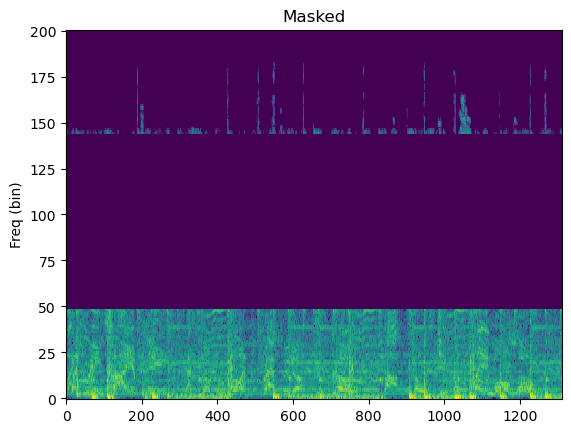

In [33]:
plot_spectrogram(original[0], title="Original", ylabel="Freq (bin)", ax=None)
plot_spectrogram(masked[0], title="Masked", ylabel="Freq (bin)", ax=None)

### Time Masking

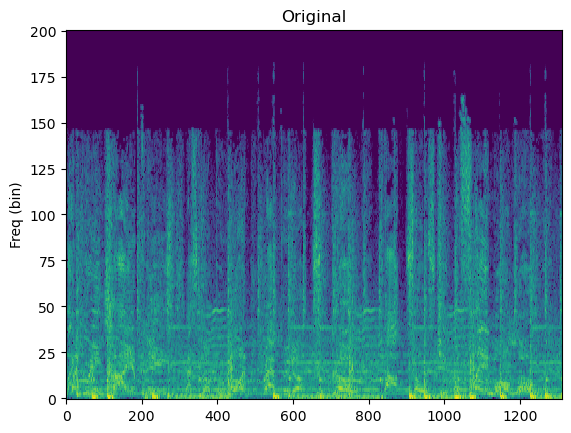

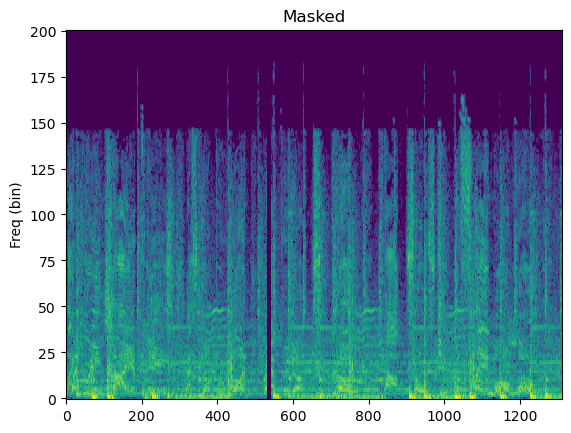

In [62]:
time_mask = torchaudio.transforms.TimeMasking(time_mask_param=15)
masked = time_mask(original)
plot_spectrogram(original[0], title="Original", ylabel="Freq (bin)", ax=None)
plot_spectrogram(masked[0], title="Masked", ylabel="Freq (bin)", ax=None)

### Does this work on MEL Spectrogams?

In [35]:
# These values are all taken as they come from the examples in the torchaudio documentation.
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128
sample_rate = 44100

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm="slaney",
    n_mels=n_mels,
    mel_scale="htk",
)

melspec = mel_spectrogram(taudio)
melspec.shape

/home/alberto/anaconda3/envs/mgr2/lib/python3.9/site-packages/torchaudio/functional/functional.py:584: UserWarning: At least one mel filterbank has all zero values. The value for `n_mels` (128) may be set too high. Or, the value for `n_freqs` (513) may be set too low.
  warnings.warn(


torch.Size([1, 128, 513])

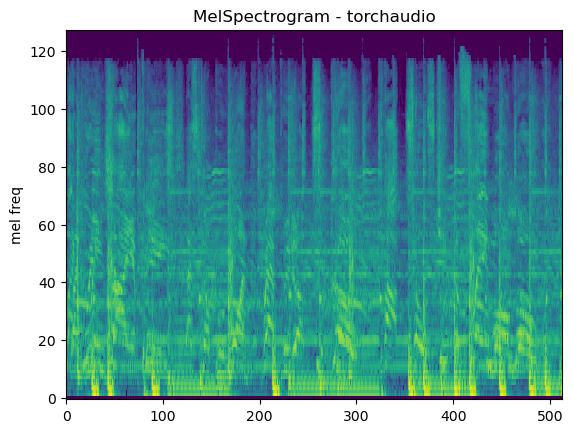

In [36]:
plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")

Running multiple times the length of the mask will change

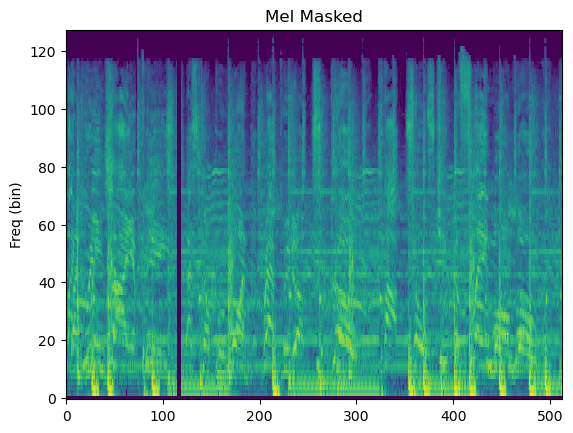

In [74]:
time_mask = torchaudio.transforms.TimeMasking(time_mask_param=5)
masked = time_mask(melspec)
plot_spectrogram(masked[0], title="Mel Masked", ylabel="Freq (bin)", ax=None)

## Torchaudio vs utils_mgr

##### Principles adopted in utils_mgr

The basic initial idea was to exactly reproduce to analysis performed in the reference paper, which analyses clips of 3s arranged in a stft spectrogram with 128 time frames (correspondent to 23ms frame considering a sampling rate of 22050 Hz) and 513 freqeuncy bins.
 In this way, the filters for the CNN model presented in the papers, move along the time direction of the spectrogram which, in our opinion, helps to learn time patterns and features necessary for the genre classification task.

 *This was our intuition, the filter moves along the first direction of the spectrogram matrix, given our results, does it need to be better understood?*

Considering a sampling rate of 44100 Hz we take 1D clips of 2^18 samples which corresponds to clips of 6s and by taking n_fft of 4096 we obtain stft frames of 92.8 ms (too long maybe? shorter clips or more stft frames) which speced by 2048 samples. In this way we obtain 128/129 time frames. This format fits the reference 2D model, but of course we can change it accordingy to our aims. Since librosa (as well as torchaudio as I see) put the frequency bins in the first direction of the tensor, we thought to transpose it so to obtain a tensor which has in its first direction the time frames.

That is the reason why the two obtained spectrogram with toorchaudio and utils_mgr differs so much now. We have to decide what to do...
A first trial could be to obtain the same frames length of 23 ms, so mantaining 1024 as n_fft and 512 ho length, in this way we obtain 512 frames. Moreover 513 freqeuncy bins are maybe too many, but this number does not affect in any way the CNN model, so we can bring it to 128 which is the reference. However i will mantain the transposition of the matrix for the aforementioned reasons.
2D CNN architecthure must then be refurbished due to the different number of neuron obtained in the first layers (more time frames)

In [51]:
# Melspec obtained with procedure above - Torchaudio
melspec.shape

torch.Size([1, 128, 513])

In [101]:
# Our mgr utils way of doing it would be so:

#stft = np.abs(librosa.stft(audio, n_fft=4096, hop_length=2048))
stft = np.abs(librosa.stft(audio, n_fft=1024, hop_length=512))

#mel = librosa.feature.melspectrogram(sr=sr, S=stft**2, n_mels=513)[:,:128]
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2, n_mels=128)[:,:512]

mel = librosa.power_to_db(mel)
melT = librosa.power_to_db(mel).T
melT.shape

(512, 128)

In [102]:
# Just convert it into tensor and add the channel dimension
tmel = torch.Tensor(mel).unsqueeze(0)
tmel.shape

torch.Size([1, 128, 512])

In [103]:
tmel[0].shape

torch.Size([128, 512])

Original mel spectrogram (transpose shape is:  (513, 128)


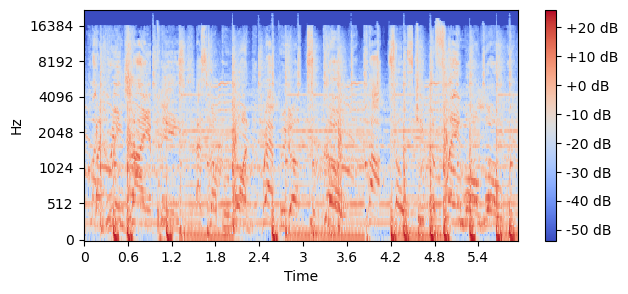

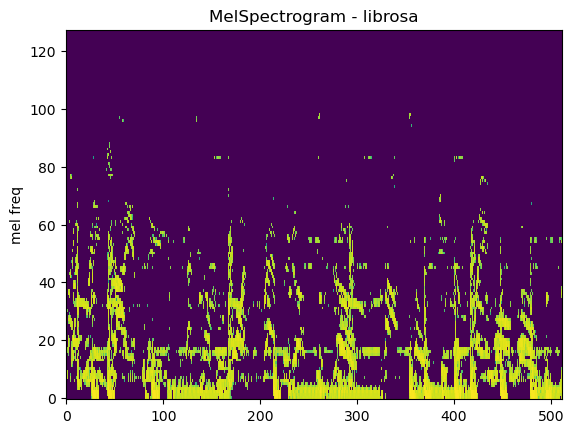

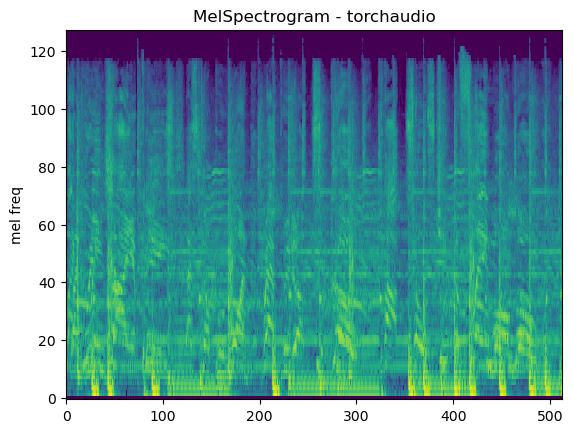

In [104]:
from mgr.utils_mgr import display_mel


display_mel(idx=2, n_samples=2**18, n_fft=1024, n_mels=128, time_bin=512, sr_i=None, PATH_DATA=PATH_DATA)
plot_spectrogram(tmel[0], title="MelSpectrogram - librosa", ylabel="mel freq")

plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")




In realtà adattando i parametri riusciamo a riprodurre i medesimi risultati sia con torchaudio che con librosa.
Abbiamo dunque piena libertà di manovra.

# Study of normalization

In [115]:
from sklearn import preprocessing

#Scale the data
scaler = preprocessing.StandardScaler(copy=False)
mel_scaled = scaler.fit_transform(mel)

# Just convert it into tensor and add the channel dimension
tmel_scaled = torch.Tensor(mel_scaled).unsqueeze(0)
tmel_scaled.shape


torch.Size([1, 128, 512])

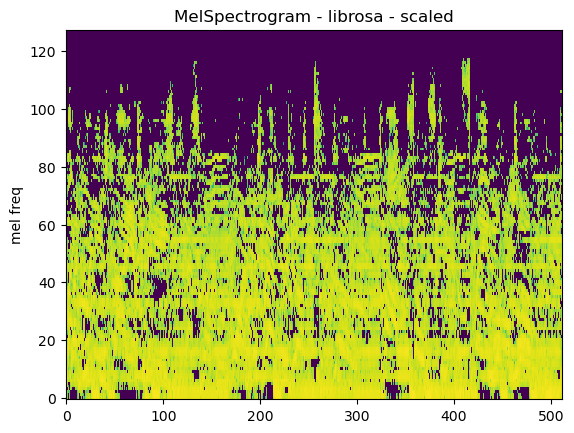

In [114]:
#Plot the scaled data
plot_spectrogram(tmel_scaled[0], title="MelSpectrogram - librosa - scaled", ylabel="mel freq")

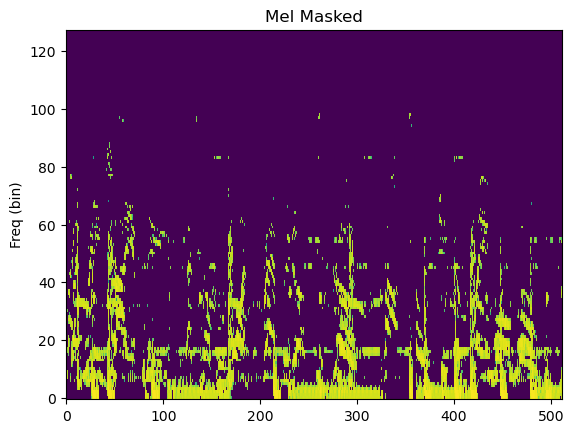

In [96]:
mel_masked = time_mask(tmel)
plot_spectrogram(mel_masked[0], title="Mel Masked", ylabel="Freq (bin)", ax=None)

Let's change the way we build the mel spectrogram

In [71]:
# Our mgr utils way of doing it would be so:

"""
n_fft = 4096 --> 1024
win_length = None
hop_length = 2048 --> 512
n_mels = 513 --> 128
sample_rate = 44100
"""

#stft = np.abs(librosa.stft(audio, n_fft=1024, hop_length=512))
stft = librosa.stft(audio, n_fft=1024, hop_length=512) # Removing np.abs

mel = librosa.feature.melspectrogram(sr=sr, S=stft**2, n_mels=128) # deleting this part [:,:128]
mel = librosa.power_to_db(mel)# .T  don't transpose
mel.shape

/tmp/ipykernel_133552/2023305971.py:15: UserWarning: power_to_db was called on complex input so phase information will be discarded. To suppress this warning, call power_to_db(np.abs(D)**2) instead.
  mel = librosa.power_to_db(mel)# .T  don't transpose


(128, 513)

There is still something wrong with our mels.

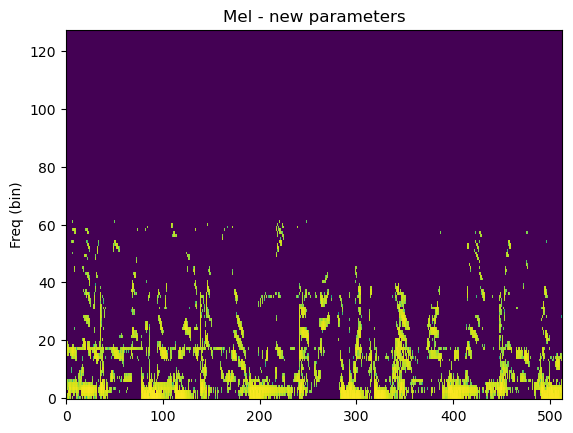

In [72]:
plot_spectrogram(mel, title="Mel - new parameters", ylabel="Freq (bin)", ax=None)

Last thing: does torchaudio work well?

## Importing audio with torchaudio

In [95]:
# It should work exactly like librosa.load but it also transforms into tensor

y = torchaudio.load("../data/fma_small/000/000002.mp3")

y[0][1]

tensor([ 0.0000,  0.0000,  0.0000,  ..., -0.2690, -0.2172, -0.1184])

Sarebbe da cambiare la funzione `getAudio`, ma in realtà non è necessario.